<a href="https://colab.research.google.com/github/muhnasih/PCVK_GANJIL_2025/blob/main/Modul11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

D1. Praktikum Deteksi Obyek Dasar


In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


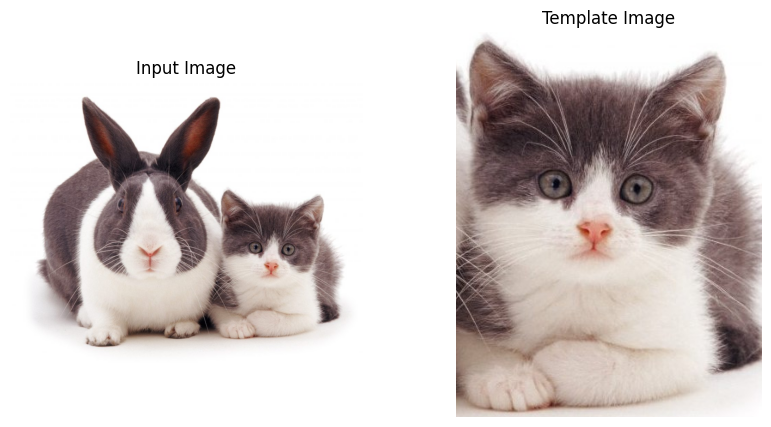

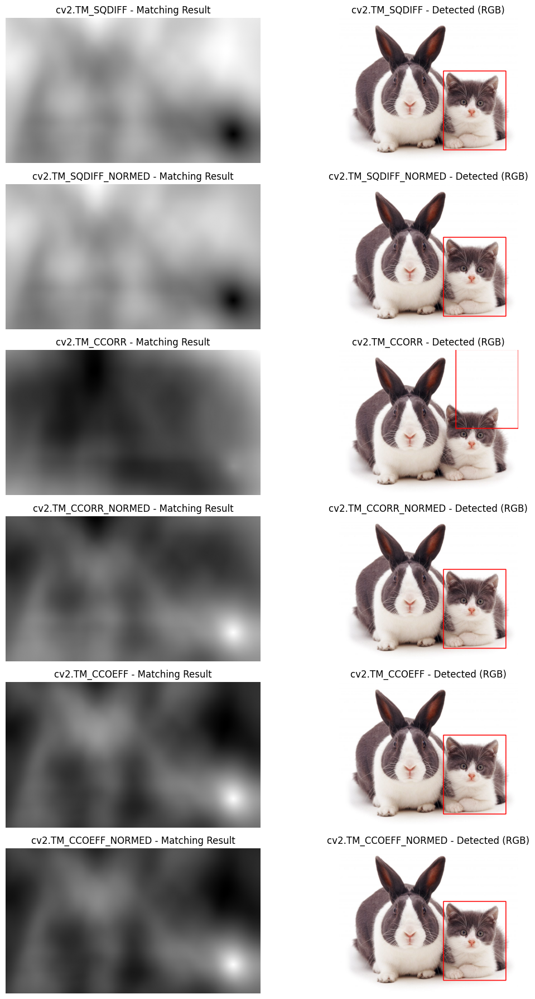

In [9]:
# Import library
import cv2
import matplotlib.pyplot as plt
from google.colab import drive

# Mount Google Drive (hanya di Colab)
drive.mount('/content/drive')

# Lokasi file
img_path = '/content/drive/MyDrive/Image/cats_and_bunnies.jpg'
template_path = '/content/drive/MyDrive/Image/cat2_templatejpg.jpg'

# Baca gambar
img_rgb = cv2.imread(img_path)
template_rgb = cv2.imread(template_path)

# Cek apakah gambar berhasil dibaca
if img_rgb is None:
    raise FileNotFoundError(f"Gambar utama tidak ditemukan di: {img_path}")
if template_rgb is None:
    raise FileNotFoundError(f"Template tidak ditemukan di: {template_path}")

# Konversi ke grayscale
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
template_gray = cv2.cvtColor(template_rgb, cv2.COLOR_BGR2GRAY)

# Ukuran template
w, h = template_gray.shape[::-1]

# Daftar metode
methods = [
    'cv2.TM_SQDIFF',
    'cv2.TM_SQDIFF_NORMED',
    'cv2.TM_CCORR',
    'cv2.TM_CCORR_NORMED',
    'cv2.TM_CCOEFF',
    'cv2.TM_CCOEFF_NORMED'
]

# Tampilkan gambar input dan template
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
plt.title('Input Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(template_rgb, cv2.COLOR_BGR2RGB))
plt.title('Template Image')
plt.axis('off')
plt.show()

# Proses semua metode
plt.figure(figsize=(12, 18))

for i, meth in enumerate(methods):
    img_copy = img_rgb.copy()
    method = eval(meth)

    # Template matching
    res = cv2.matchTemplate(img_gray, template_gray, method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

    # Tentukan lokasi terbaik
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc

    bottom_right = (top_left[0] + w, top_left[1] + h)

    # Gambar kotak deteksi
    cv2.rectangle(img_copy, top_left, bottom_right, (0, 0, 255), 3)

    # Plot hasil
    plt.subplot(6, 2, i*2 + 1)
    plt.imshow(res, cmap='gray')
    plt.title(f'{meth} - Matching Result')
    plt.axis('off')

    plt.subplot(6, 2, i*2 + 2)
    plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
    plt.title(f'{meth} - Detected (RGB)')
    plt.axis('off')

plt.tight_layout()
plt.show()

### 2. Template Matching pada OpenCV


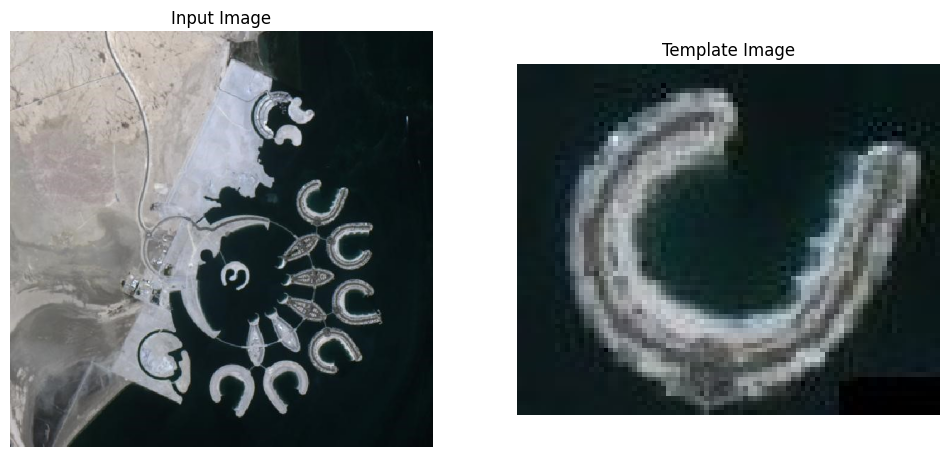

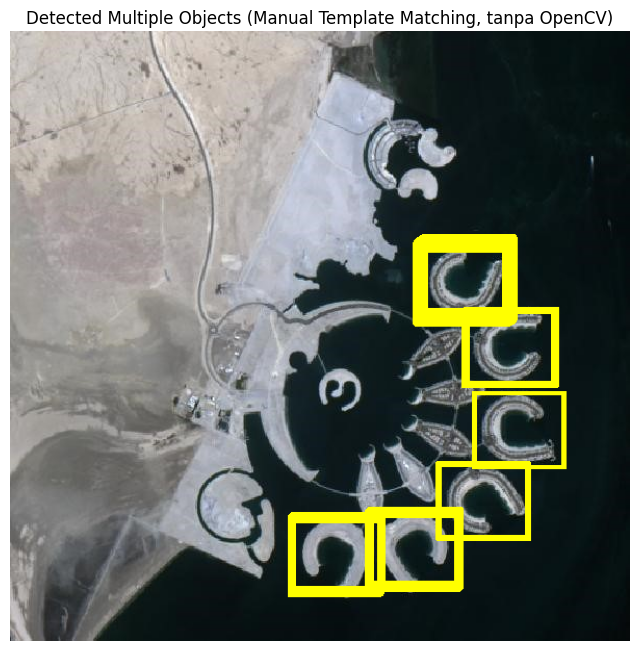

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
from scipy.signal import correlate2d

# Lokasi gambar di Google Drive
img_path = '/content/drive/MyDrive/Image/bahrain.jpg'
template_path = '/content/drive/MyDrive/Image/bahrain-template.jpg'

# Baca gambar dan ubah ke RGB
img_rgb = Image.open(img_path).convert('RGB')
template_rgb = Image.open(template_path).convert('RGB')

# Konversi ke grayscale (tanpa OpenCV)
img_gray = np.array(img_rgb.convert('L'), dtype=np.float32)
template_gray = np.array(template_rgb.convert('L'), dtype=np.float32)

# Ukuran template
th, tw = template_gray.shape

# Hitung normalized cross correlation secara manual (pakai SciPy, bukan OpenCV)
template_mean = template_gray - np.mean(template_gray)
res = correlate2d(img_gray, template_mean, mode='valid')

# Normalisasi hasil korelasi agar skala 0–1
res_norm = (res - np.min(res)) / (np.max(res) - np.min(res))

# Tentukan threshold deteksi (semakin kecil = semakin sensitif)
threshold = 0.69
y_coords, x_coords = np.where(res_norm >= threshold)

# Gambar rectangle hasil deteksi (kuning)
img_result = img_rgb.copy()
draw = ImageDraw.Draw(img_result)
for (x, y) in zip(x_coords, y_coords):
    draw.rectangle([x, y, x + tw, y + th], outline="yellow", width=3)

# Tampilkan hasil
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Input Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(template_rgb)
plt.title('Template Image')
plt.axis('off')
plt.show()

plt.figure(figsize=(8, 8))
plt.imshow(img_result)
plt.title('Detected Multiple Objects (Manual Template Matching, tanpa OpenCV)')
plt.axis('off')
plt.show()


### 4. Sobel Edge Detection, Canny Edge Detection, dan Laplacian Edge Detection pada OpenCV

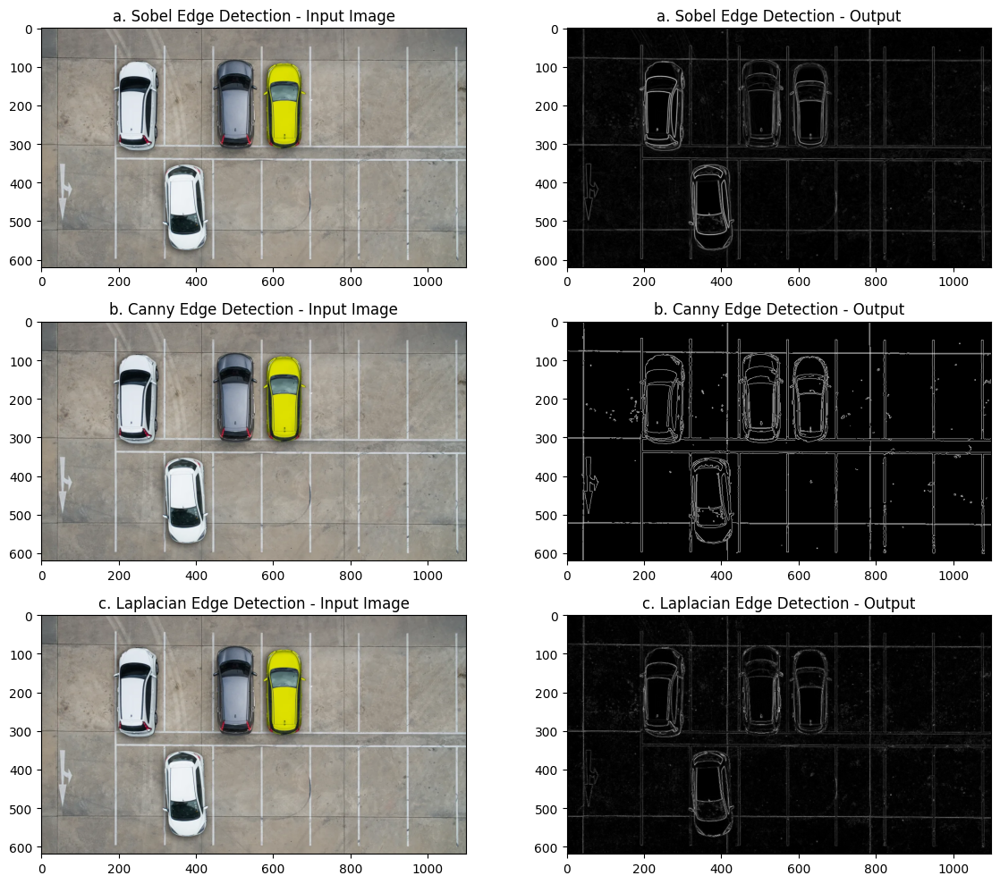

In [14]:
# Path citra input
img_path = '/content/drive/MyDrive/Image/car-park.jpg'

# Membaca citra
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# a. SOBEL EDGE DETECTION
sobelx = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)
sobel_combined = cv2.magnitude(sobelx, sobely)

# b. CANNY EDGE DETECTION
edges_canny = cv2.Canny(img_gray, 100, 200)

# c. LAPLACIAN EDGE DETECTION
laplacian = cv2.Laplacian(img_gray, cv2.CV_64F)
laplacian = cv2.convertScaleAbs(laplacian)

# VISUALISASI
plt.figure(figsize=(12, 10))

# ---- Sobel ----
plt.subplot(3, 2, 1)
plt.imshow(img_rgb)
plt.title("a. Sobel Edge Detection - Input Image")

plt.subplot(3, 2, 2)
plt.imshow(sobel_combined, cmap='gray')
plt.title("a. Sobel Edge Detection - Output")

# ---- Canny ----
plt.subplot(3, 2, 3)
plt.imshow(img_rgb)
plt.title("b. Canny Edge Detection - Input Image")

plt.subplot(3, 2, 4)
plt.imshow(edges_canny, cmap='gray')
plt.title("b. Canny Edge Detection - Output")

# ---- Laplacian ----
plt.subplot(3, 2, 5)
plt.imshow(img_rgb)
plt.title("c. Laplacian Edge Detection - Input Image")

plt.subplot(3, 2, 6)
plt.imshow(laplacian, cmap='gray')
plt.title("c. Laplacian Edge Detection - Output")

plt.tight_layout()
plt.show()

### 5. Harris Corner Detection dan Shi-Tomasi Detecttion pada OpenCV

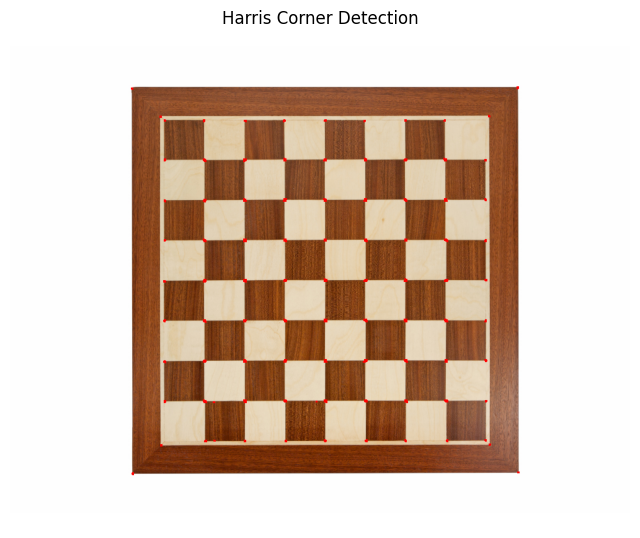

In [15]:
# Load gambar
img = cv2.imread('/content/drive/MyDrive/Image/chess-board.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Konversi ke float32 (syarat Harris)
gray_float = np.float32(gray)

# Harris Corner Detection
dst = cv2.cornerHarris(gray_float, blockSize=2, ksize=3, k=0.04)

# Dilasi agar titik sudut lebih jelas
dst = cv2.dilate(dst, None)

# Threshold untuk menandai corner yang kuat
img_harris = img.copy()
img_harris[dst > 0.01 * dst.max()] = [0, 0, 255]  # warna merah

# Tampilkan hasil
plt.figure(figsize=(8,8))
plt.imshow(cv2.cvtColor(img_harris, cv2.COLOR_BGR2RGB))
plt.title('Harris Corner Detection')
plt.axis('off')
plt.show()




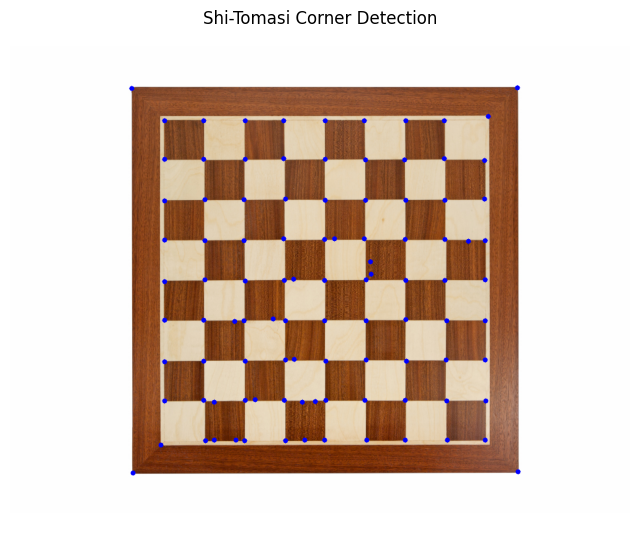

In [16]:
# Deteksi sudut dengan Shi-Tomasi
corners = cv2.goodFeaturesToTrack(gray, maxCorners=100, qualityLevel=0.01, minDistance=10)

# Konversi tipe data agar bisa diakses
corners = corners.astype(int)

# Gambar titik corner
img_shi = img.copy()
for i in corners:
    x, y = i.ravel()
    cv2.circle(img_shi, (x, y), 4, (255, 0, 0), -1)

# Tampilkan hasil
plt.figure(figsize=(8,8))
plt.imshow(cv2.cvtColor(img_shi, cv2.COLOR_BGR2RGB))
plt.title('Shi-Tomasi Corner Detection')
plt.axis('off')
plt.show()


### 6. Hough Transform pada OpenCV

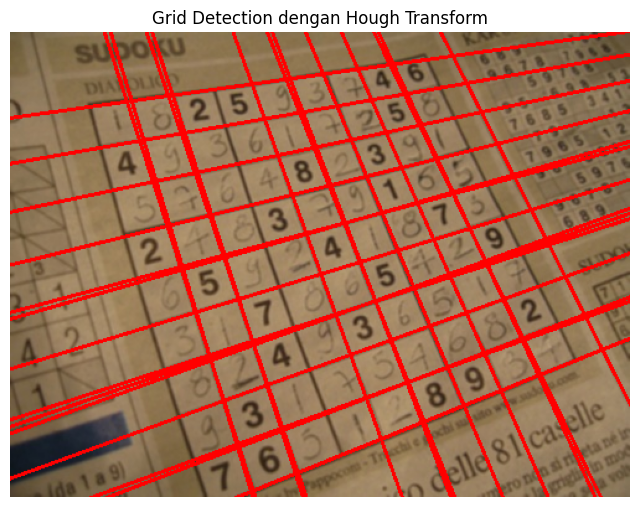

In [18]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# 1. Load gambar dan ubah ke grayscale
img = cv2.imread('/content/drive/MyDrive/Image/sudoku.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 2. Canny Edge Detection
edges = cv2.Canny(gray, 50, 150, apertureSize=3)

# 3. Dilation dan Erosion untuk menggabungkan garis
kernel = np.ones((3,3), np.uint8)
dilated = cv2.dilate(edges, kernel, iterations=1)
eroded = cv2.erode(dilated, kernel, iterations=1)

# 4. Hough Transform
lines = cv2.HoughLines(eroded, 1, np.pi/180, 292)

# 5. Gambar garis merah pada citra asli
result = img.copy()
if lines is not None:
    for line in lines:
        rho, theta = line[0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))
        cv2.line(result, (x1, y1), (x2, y2), (0, 0, 255), 2)  # warna merah

# 6. Tampilkan hasil akhir
plt.figure(figsize=(8,8))
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title('Grid Detection dengan Hough Transform')
plt.axis('off')
plt.show()




```
# Ini diformat sebagai kode
```

### 7. findContours() pada OpenCV

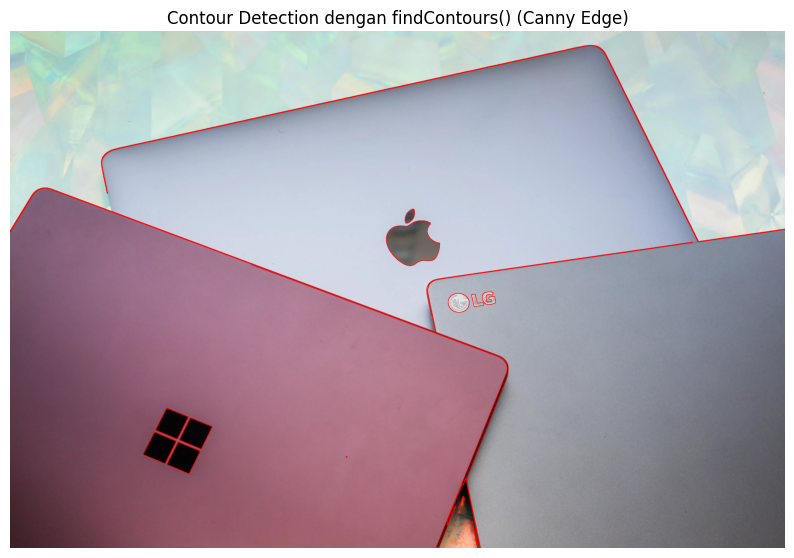

In [22]:
# 1. Load gambar
img = cv2.imread('/content/drive/MyDrive/Image/laptop.jpg')

# 2. Ubah ke grayscale dan haluskan dulu untuk mengurangi noise
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = cv2.GaussianBlur(gray, (5,5), 0)

# 3. Gunakan Canny edge detection (lebih stabil dari threshold biasa)
edges = cv2.Canny(gray, 50, 150)

# 4. Dilasi sedikit untuk menyambungkan tepi yang terputus
kernel = np.ones((3,3), np.uint8)
edges = cv2.dilate(edges, kernel, iterations=1)

# 5. Temukan kontur pada hasil edge
contours, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# 6. Gambar kontur pada gambar asli
result = img.copy()
cv2.drawContours(result, contours, -1, (0, 0, 255), 2)  # warna merah

# 7. Tampilkan hasil
plt.figure(figsize=(10, 8))
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title('Contour Detection dengan findContours() (Canny Edge)')
plt.axis('off')
plt.show()

## D2.D Praktikum Feature Matching dan Face Detection

### 1. Face Detection untuk image object lain

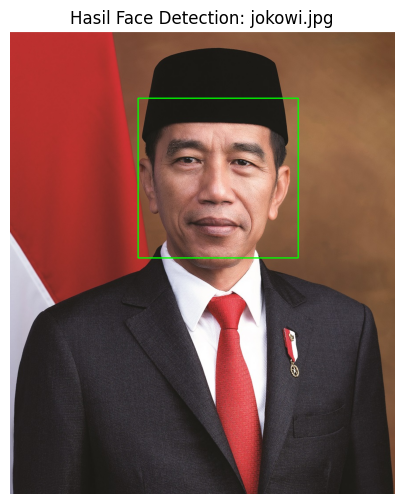

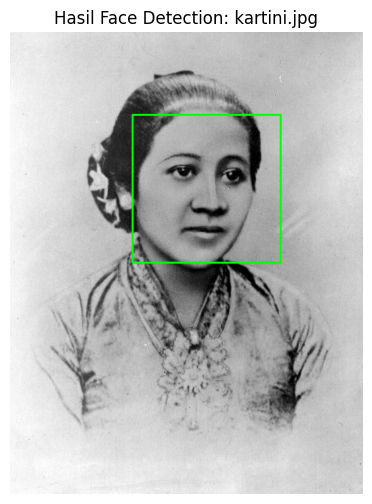

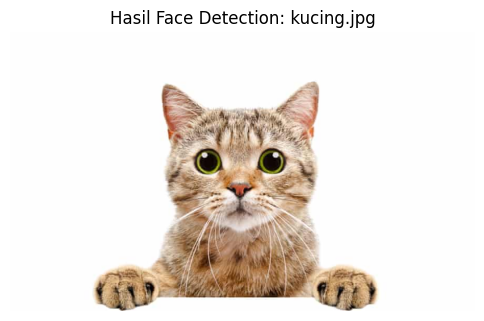

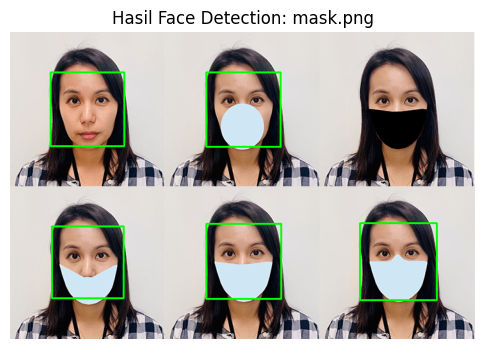

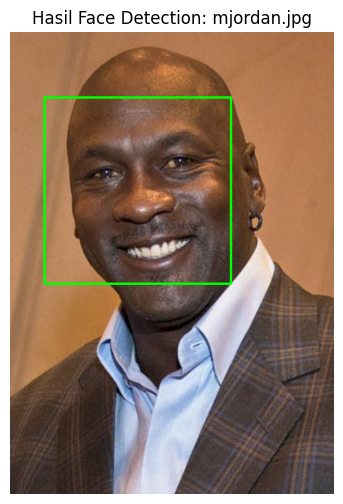

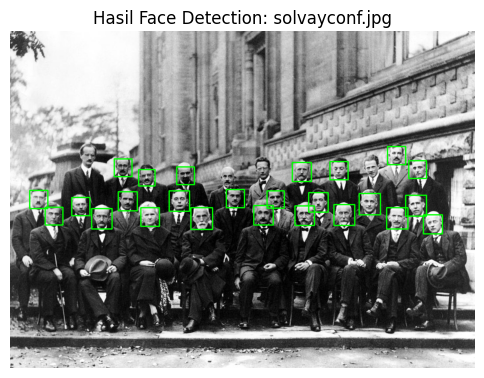

In [26]:
# 1. Load pretrained Haar Cascade untuk deteksi wajah
cascade_wajah = cv2.CascadeClassifier('/content/drive/MyDrive/Image/haarcascade_frontalface_alt.xml')

# 2. Daftar gambar yang akan diuji
image_paths = [
    '/content/drive/MyDrive/Image/jokowi.jpg',
    '/content/drive/MyDrive/Image/kartini.jpg',
    '/content/drive/MyDrive/Image/kucing.jpg',
    '/content/drive/MyDrive/Image/mask.png',
    '/content/drive/MyDrive/Image/mjordan.jpg',
    '/content/drive/MyDrive/Image/solvayconf.jpg'
]

# 3. Loop setiap gambar
for path in image_paths:
    # Baca gambar dalam grayscale
    img = cv2.imread(path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # 4. Deteksi wajah
    faces = cascade_wajah.detectMultiScale(
        gray,
        scaleFactor=1.1,   # skala pengurangan tiap pencarian
        minNeighbors=5,    # jumlah tetangga yang harus cocok
        minSize=(30, 30)   # ukuran minimum wajah
    )

    # 5. Gambar kotak di wajah yang terdeteksi
    for (x, y, w, h) in faces:
        cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    # 6. Tampilkan hasil
    plt.figure(figsize=(6,6))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f'Hasil Face Detection: {path.split("/")[-1]}')
    plt.axis('off')
    plt.show()

### 2. Deteksi Wajah Kucing

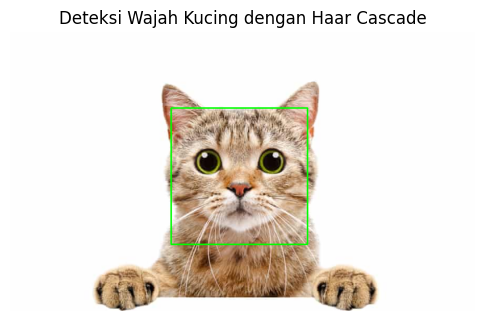

In [27]:
# 1. Load pretrained Haar Cascade untuk wajah kucing
cascade_cat = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalcatface.xml')

# 2. Load gambar kucing
img = cv2.imread('/content/drive/MyDrive/Image/kucing.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 3. Deteksi wajah kucing
cats = cascade_cat.detectMultiScale(
    gray,
    scaleFactor=1.1,  # deteksi lebih sensitif
    minNeighbors=6,    # semakin kecil semakin sensitif (tapi hati-hati noise)
    minSize=(100, 100)   # ukuran minimum wajah
)

# 4. Gambar kotak deteksi
for (x, y, w, h) in cats:
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

# 5. Tampilkan hasil
plt.figure(figsize=(6,6))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Deteksi Wajah Kucing dengan Haar Cascade')
plt.axis('off')
plt.show()


### 3. Eyes Detection Wajah Pak Jokowi

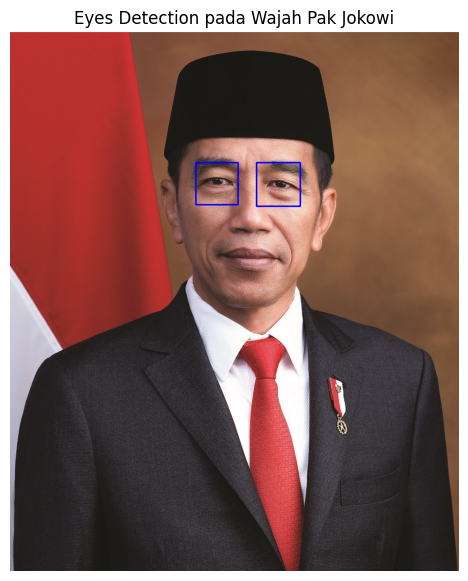

In [28]:
# 1. Load pretrained Haar Cascade untuk wajah dan mata
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_alt.xml')
eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')

# 2. Load gambar Jokowi
img = cv2.imread('/content/drive/MyDrive/Image/jokowi.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 3. Deteksi wajah
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

# 4. Deteksi mata di dalam area wajah
for (x, y, w, h) in faces:
    # Tentukan ROI (region of interest) pada wajah
    roi_gray = gray[y:y+h, x:x+w]
    roi_color = img[y:y+h, x:x+w]

    # Deteksi mata di dalam ROI
    eyes = eye_cascade.detectMultiScale(roi_gray, scaleFactor=1.1, minNeighbors=10, minSize=(20, 20))

    # Gambar kotak biru di sekitar mata
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(roi_color, (ex, ey), (ex+ew, ey+eh), (255, 0, 0), 2)  # warna biru

# 5. Tampilkan hasil
plt.figure(figsize=(7,7))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Eyes Detection pada Wajah Pak Jokowi')
plt.axis('off')
plt.show()

### 4. Deteksi Senyuman

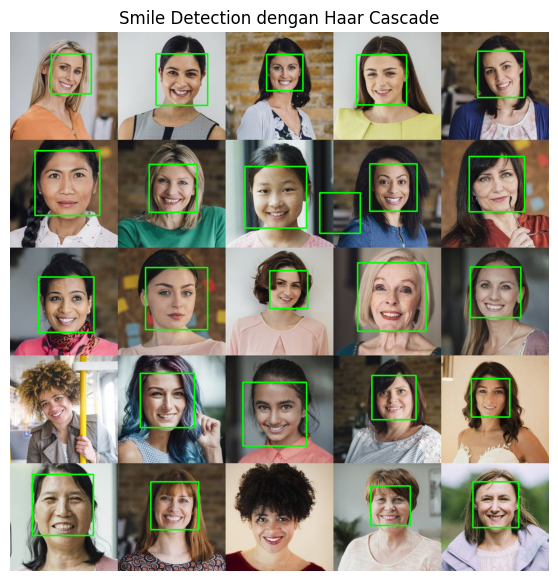

In [34]:
# 1. Load model Haar Cascade untuk wajah dan senyum
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_alt.xml')
smile_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_smile.xml')

# 2. Load gambar people
img = cv2.imread('/content/drive/MyDrive/Image/smile.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 3. Deteksi wajah
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

# 4. Untuk setiap wajah, deteksi senyum di dalam ROI
for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)  # kotak hijau untuk wajah
    roi_gray = gray[y:y+h, x:x+w]
    roi_color = img[y:y+h, x:x+w]

    # 5. Deteksi senyuman
    smiles = smile_cascade.detectMultiScale(
        roi_gray,
        scaleFactor=1.8,    # nilai tinggi agar hanya deteksi bentuk senyum nyata
        minNeighbors=40,    # semakin besar -> semakin sedikit false positive
        minSize=(50, 50)
    )

    # 6. Gambar kotak di area senyum
    for (sx, sy, sw, sh) in smiles:
        cv2.rectangle(roi_color, (sx, sy), (sx+sw, sy+sh), (0, 0, 255), 2)

# 7. Tampilkan hasil
plt.figure(figsize=(7,7))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Smile Detection dengan Haar Cascade')
plt.axis('off')
plt.show()

### 5. Face Tracking

In [35]:
# import dependencies

from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time


In [36]:
# Helper Function

# function to convert the JavaScript object into an OpenCV image
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

# function to convert OpenCV Rectangle bounding box image into base64 byte string to be overlayed on video stream
def bbox_to_bytes(bbox_array):
  """
  Params:
          bbox_array: Numpy array (pixels) containing rectangle to overlay on video stream.
  Returns:
        bytes: Base64 image byte string
  """
  # convert array into PIL image
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()
  # format bbox into png for return
  bbox_PIL.save(iobuf, format='png')
  # format return string
  bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

  return bbox_bytes

In [37]:
# initialize the Haar Cascade face detection model
face_cascade = cv2.CascadeClassifier(cv2.samples.findFile(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'))

In [38]:
# Webcam Images

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)

  # get photo data
  data = eval_js('takePhoto({})'.format(quality))
  # get OpenCV format image
  img = js_to_image(data)
  # grayscale img
  gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  print(gray.shape)
  # get face bounding box coordinates using Haar Cascade
  faces = face_cascade.detectMultiScale(gray)
  # draw face bounding box on image
  for (x,y,w,h) in faces:
      img = cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
  # save image
  cv2.imwrite(filename, img)

  return filename

<IPython.core.display.Javascript object>

(480, 640)
Saved to photo.jpg


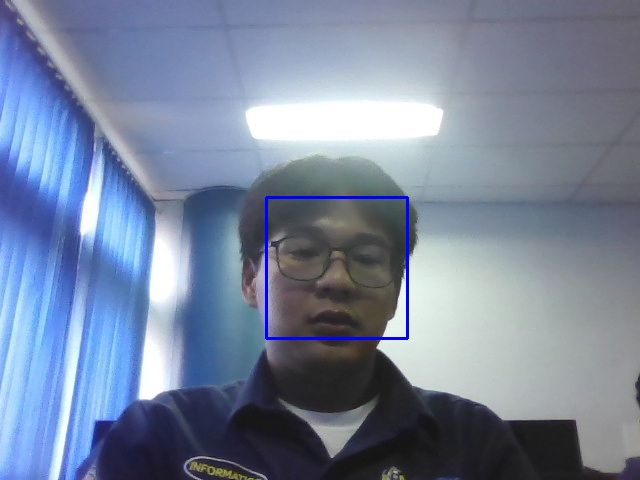

In [41]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))

  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

### 6. Blurring pada wajah

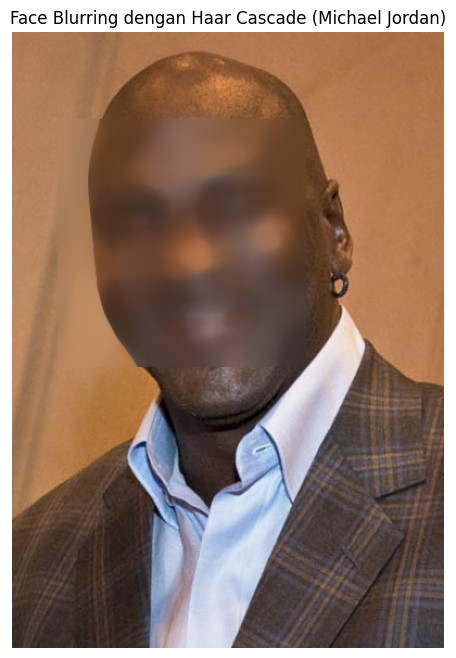

In [42]:
# 1. Load model Haar Cascade untuk deteksi wajah
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_alt.xml')

# 2. Baca gambar
img = cv2.imread('/content/drive/MyDrive/Image/mjordan.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 3. Deteksi wajah
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(50, 50))

# 4. Blurring pada setiap area wajah yang terdeteksi
for (x, y, w, h) in faces:
    # Ambil ROI wajah
    face_roi = img[y:y+h, x:x+w]

    # Terapkan efek blur (median blur)
    face_blur = cv2.medianBlur(face_roi, 35)  # semakin besar nilainya, semakin buram

    # Ganti ROI dengan versi blur
    img[y:y+h, x:x+w] = face_blur

# 5. Tampilkan hasil akhir
plt.figure(figsize=(8,8))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Face Blurring dengan Haar Cascade (Michael Jordan)')
plt.axis('off')
plt.show()

### 7. KTM

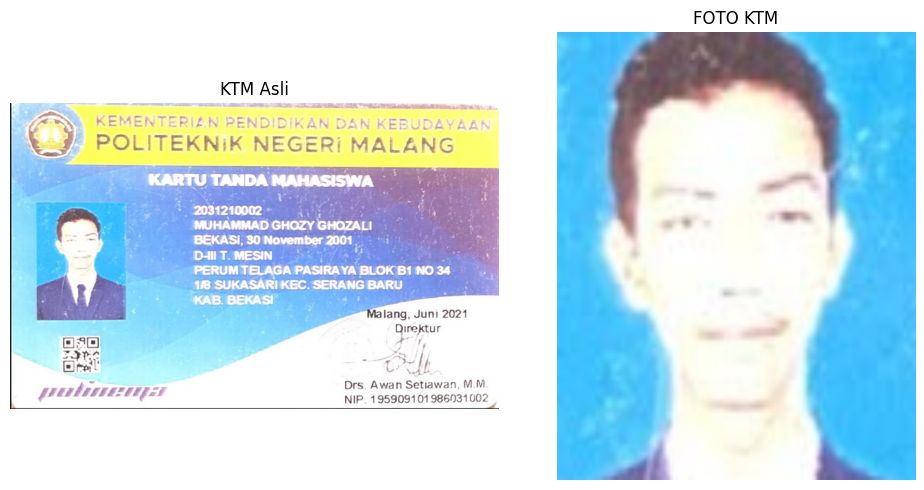

In [46]:
# 1. Load model deteksi wajah
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_alt.xml')

# 2. Baca gambar KTM
img = cv2.imread('/content/drive/MyDrive/Image/KTM lama.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 3. Deteksi wajah
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

# 4. Jika wajah ditemukan, crop dan tampilkan
for (x, y, w, h) in faces:
    # Tambahkan margin supaya wajah tidak kepotong
    pad_x, pad_y = int(w*0.2), int(h*0.2)
    y1, y2 = max(0, y-pad_y), min(img.shape[0], y+h+pad_y)
    x1, x2 = max(0, x-pad_x), min(img.shape[1], x+w+pad_x)

    crop_face = img[y1:y2, x1:x2]
    crop_resized = cv2.resize(crop_face, (400, 500))

    # 5. Tampilkan hasil
    plt.figure(figsize=(10,5))

    # Gambar asli
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('KTM Asli')
    plt.axis('off')

    # Hasil crop wajah
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(crop_resized, cv2.COLOR_BGR2RGB))
    plt.title('FOTO KTM')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


**Deteksi wajah pada ktm dengan barang lain**

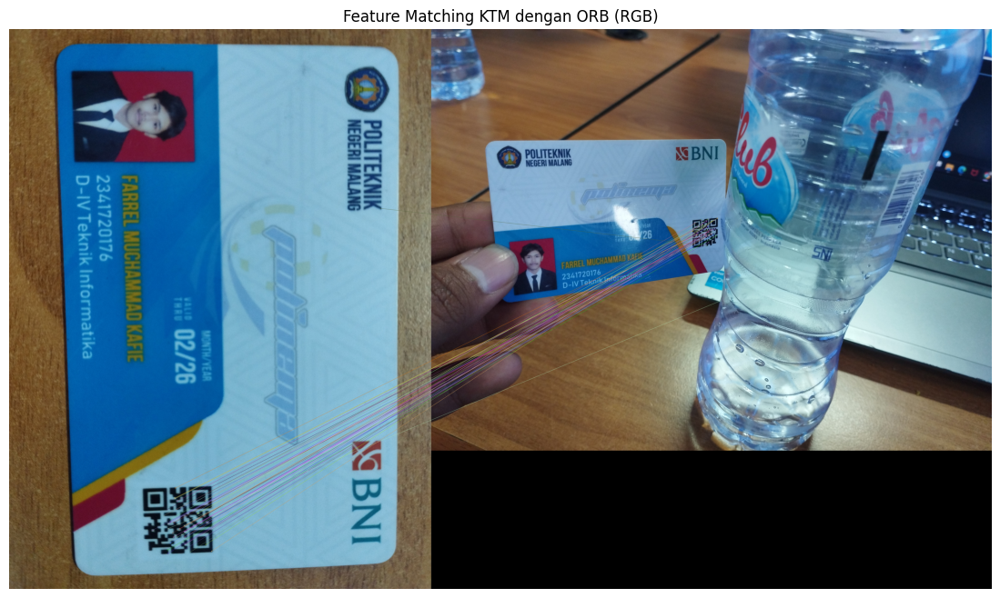

In [52]:
# 1. Baca gambar (versi berwarna)
img_object_color = cv2.imread('/content/drive/MyDrive/Image/ktpnasih.jpg')
img_scene_color = cv2.imread('/content/drive/MyDrive/Image/Ktpbarang.jpg')

# 2. Konversi ke grayscale untuk perhitungan fitur
img_object_gray = cv2.cvtColor(img_object_color, cv2.COLOR_BGR2GRAY)
img_scene_gray = cv2.cvtColor(img_scene_color, cv2.COLOR_BGR2GRAY)

# 3. Inisialisasi ORB detector
orb = cv2.ORB_create(nfeatures=1000)

# 4. Deteksi keypoints & descriptors
kp1, des1 = orb.detectAndCompute(img_object_gray, None)
kp2, des2 = orb.detectAndCompute(img_scene_gray, None)

# 5. Pencocokan fitur (Brute Force + Hamming)
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

# 6. Gambar hasil matching (versi warna)
result = cv2.drawMatches(
    img_object_color, kp1,
    img_scene_color, kp2,
    matches[:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

# 7. Konversi dari BGR → RGB untuk tampilan matplotlib
result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

# 8. Tampilkan hasil
plt.figure(figsize=(15, 8))
plt.imshow(result_rgb)
plt.title('Feature Matching KTM dengan ORB (RGB)')
plt.axis('off')
plt.show()